## Tutorial 2 Niche query benchmark on DLPFC dataset

To systematically benchmark niche querying performance on real datasets with a substantial number of samples, we used the Human Dorsolateral Prefrontal Cortex32 (DLPFC) dataset. This dataset consists of 12 well-annotated spatial transcriptomic samples with a total of types of layers.

In [ ]:
import os
import sys
import logging
import warnings
import numpy as np
import scanpy as sc
import matplotlib.pyplot as plt

In [ ]:
import bench.bench_utils as bench_utils  # TODO: delete codebase
from models.trainer import QueSTTrainer
warnings.filterwarnings("ignore")
logger = logging.getLogger(__name__)
logging.basicConfig(level=logging.INFO)
os.environ['CUDA_LAUNCH_BLOCKING'] = '1'

### Read and explore the data

In [ ]:
data_path = "./data/DLPFC"
sample_ids = ["151507", "151508", "151509", "151510", "151669", "151670", 
              "151671", "151672", "151673", "151674", "151675", "151676"]
adata_list = [sc.read_h5ad(f"{data_path}/{data_id}.h5ad") for data_id in sample_ids]

To include various layer composition scenarios, we defined seven niche types: four composed of two layers, and the rest three composed of three layers. For each niche type, we randomly sampled three replicates in each sample.

In [ ]:
niche_groups = ["Layer3_Layer4_100", "Layer4_Layer5_100", "Layer5_Layer6_100", "Layer6_WM_100",
                "Layer3_Layer4_Layer5_100", "Layer4_Layer5_Layer6_100", "Layer5_Layer6_WM_100"]
niche_replicates = [0, 1, 2]

Here we show all the query niches and ground truth layer annotation.

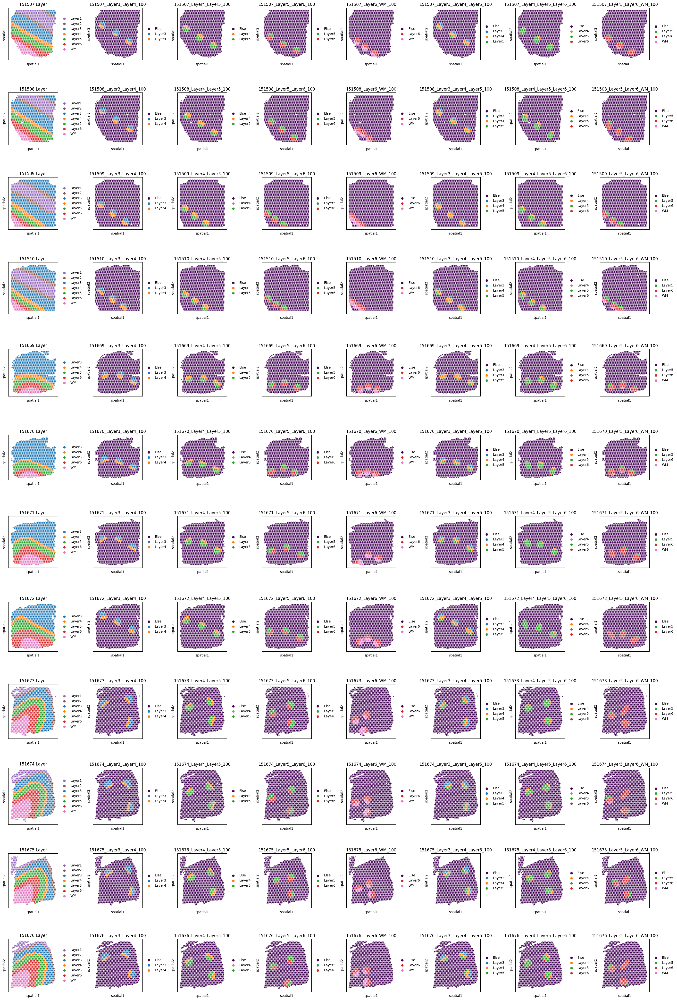

In [5]:
nrows, ncols = 12, 8
fig, axs = plt.subplots(nrows, ncols, figsize=(28, 42))  # figsize is (col, row)
axs = axs.flatten()
for i, sample_name in enumerate(sample_ids):
    sc.pl.spatial(adata_list[i], color="Layer", ax=axs[i * ncols], spot_size=5, show=False, palette=bench_utils.color_dlpfc, title=f"{sample_ids[i]} Layer")
    axs[i * ncols].invert_yaxis()
    for j, niche_group in enumerate(niche_groups):
        title = f"{sample_name}_{niche_group}"
        sc.pl.spatial(adata_list[i], color=f'{niche_group}_layer', spot_size=5, ax=axs[i * ncols + j + 1], show=False, palette=bench_utils.color_dlpfc, title=title)
        axs[i * ncols + j + 1].invert_yaxis()
fig.tight_layout()
fig.show()

### Configure niche query task

Here we use the niche named Layer5_Layer6_100_replicate=0 on sample 151670 as an example.

In [ ]:
dataset = "DLPFC"
query_sample_id = "151670"
query_niches = ['Layer5_Layer6_100_replicate=0_niche']

We also show the Region Matching Score of this query niche on the other referene samples. We use this score as a ground truth niche similarity measurement.

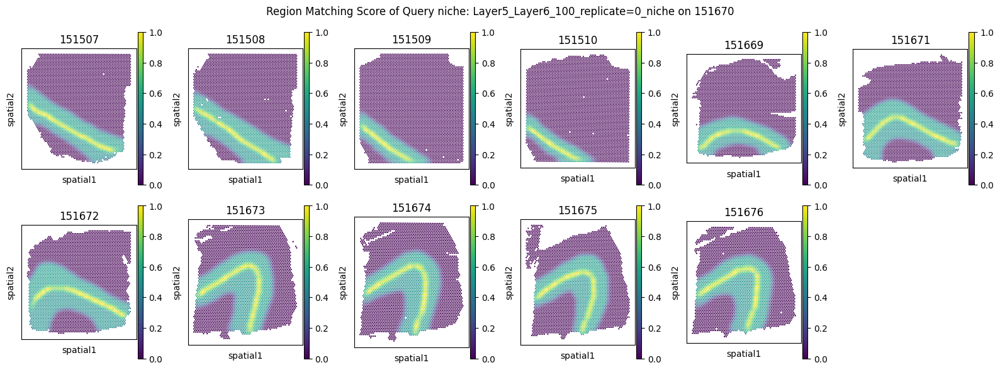

In [6]:
adata_ref_list = [adata for adata in adata_list if adata.uns['library_id'] != query_sample_id]
ref_id_list = [adata.uns['library_id'] for adata in adata_ref_list]
adata_plot = adata_list[sample_ids.index("151673")]
fig, axes = plt.subplots(ncols=6, nrows=2, figsize=(16, 6))
axes = axes.flatten()
for i, adata_ref in enumerate(adata_ref_list):
    sc.pl.spatial(adata_ref, color=f"{query_sample_id}_Layer5_Layer6_100_replicate=0_region_matching_score", 
                  spot_size=5, show=False, title=f"{adata_ref.uns['library_id']}", ax=axes[i])
    axes[i].invert_yaxis()
axes[11].axis('off')
fig.suptitle(f"Region Matching Score of Query niche: {query_niches[0]} on {query_sample_id}")
fig.tight_layout()
fig.show()

### Set up QueST Trainer

In [ ]:
trainer = QueSTTrainer(dataset=dataset, data_path=data_path, sample_ids=sample_ids, adata_list=adata_list,
                       query_niches=query_niches, query_sample_id=query_sample_id, 
                       model_path="./results/DLPFC/model/quest_model.pth", 
                       epochs=20, save_model=True, hvg=3000, min_count=10, normalize=True)

INFO:codebase.models.trainer:Processing arguments, time: 2025/05/03 21:59:52
INFO:codebase.models.trainer:using GPU 0
INFO:codebase.models.trainer:QueST Trainer initialized, loading data, time: 2025/05/03 21:59:52
INFO:codebase.models.trainer:Data loaded with 12 adata objects, time: 2025/05/03 21:59:52


### Train QueST model

In [9]:
trainer.train()

INFO:codebase.models.trainer:adata 151507 has existing graph
INFO:codebase.models.trainer:adata 151508 has existing graph
INFO:codebase.models.trainer:adata 151509 has existing graph
INFO:codebase.models.trainer:adata 151510 has existing graph


INFO:codebase.models.trainer:adata 151669 has existing graph
INFO:codebase.models.trainer:adata 151670 has existing graph
INFO:codebase.models.trainer:adata 151671 has existing graph
INFO:codebase.models.trainer:adata 151672 has existing graph
INFO:codebase.models.trainer:adata 151673 has existing graph
INFO:codebase.models.trainer:adata 151674 has existing graph
INFO:codebase.models.trainer:adata 151675 has existing graph
INFO:codebase.models.trainer:adata 151676 has existing graph
INFO:codebase.models.model_utils:preprocessing adata, selecting common features
INFO:codebase.models.model_utils:gene num before intersection: [33538, 33538, 33538, 33538, 33538, 33538, 33538, 33538, 33538, 33538, 33538, 33538]
INFO:codebase.models.model_utils:33538 common genes identified
INFO:codebase.models.model_utils:gene num after intersection: [33538, 33538, 33538, 33538, 33538, 33538, 33538, 33538, 33538, 33538, 33538, 33538]
INFO:codebase.models.model_utils:filtering genes with min count=10
INFO:co

### Use trained QueST model to perform niche query

In [ ]:
trainer.inference(save_embedding=False, query=True)

INFO:codebase.models.trainer:Loading model, time: 2025/05/03 22:16:32
INFO:codebase.models.trainer:Performing query: q_id=151670, q_niche=Layer5_Layer6_100_replicate=0_niche, time: 2025/05/03 22:16:32
INFO:codebase.models.trainer:Processing 151507, saving predicted niche matching score to Anndata
INFO:codebase.models.trainer:Processing 151508, saving predicted niche matching score to Anndata
INFO:codebase.models.trainer:Processing 151509, saving predicted niche matching score to Anndata
INFO:codebase.models.trainer:Processing 151510, saving predicted niche matching score to Anndata
INFO:codebase.models.trainer:Processing 151669, saving predicted niche matching score to Anndata
INFO:codebase.models.trainer:Processing 151671, saving predicted niche matching score to Anndata
INFO:codebase.models.trainer:Processing 151672, saving predicted niche matching score to Anndata
INFO:codebase.models.trainer:Processing 151673, saving predicted niche matching score to Anndata
INFO:codebase.models.tr

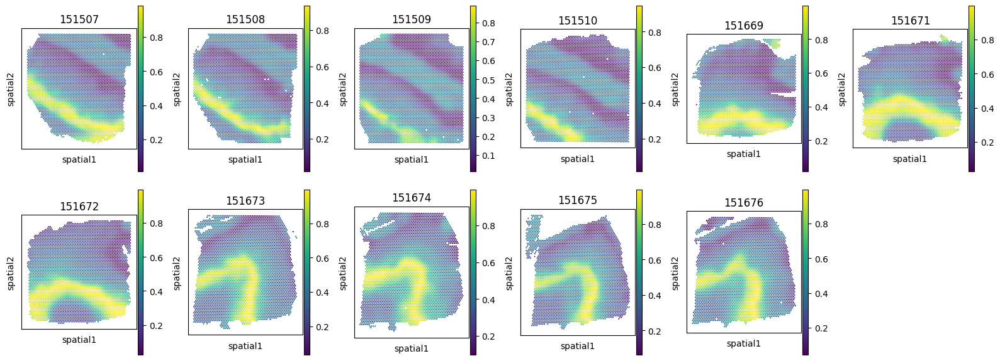

In [11]:
fig, axes = plt.subplots(ncols=6, nrows=2, figsize=(16, 6))
axes = axes.flatten()
query_niche = query_niches[0]
adata_ref = trainer.adata_ref_list[0]
for i, adata_ref in enumerate(trainer.adata_ref_list):
    sc.pl.spatial(adata_ref, color=f"{query_niche} predicted matching score", ax=axes[i], show=False, 
                  spot_size=5, title=f"{adata_ref.uns['library_id']}")
    axes[i].invert_yaxis()
axes[11].axis('off')
fig.tight_layout()
fig.show()